In [1]:
import os 
import numpy as np
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from copy import deepcopy
from scipy.spatial.distance import pdist
import itertools as it 
os.chdir('..')
from src.data_cleaning import *
from src.autograd_mds import *
from autograd import grad, elementwise_grad 
from loguru import logger
import sys

from matplotlib.collections import LineCollection

from sklearn import manifold
from sklearn.metrics import euclidean_distances
from sklearn.decomposition import PCA
from sklearn.utils import check_random_state
from sklearn.manifold import MDS
# Unused but required import for doing 3d projections with matplotlib < 3.2
import mpl_toolkits.mplot3d  # noqa: F401
import warnings


In [2]:
os.listdir()


['.git',
 '.gitignore',
 'config',
 'data',
 'doc',
 'Dockerfile',
 'notebook',
 'pyproject.toml',
 'README.md',
 'requirements.txt',
 'src',
 'test']

In [3]:
url = 'http://cs.bc.edu/~prudhome/AAPLD/animal-similarity.csv'

raw_dataset = pd.read_csv(url, index_col=0)
list_of_animal_pairs = raw_dataset.index.str.split('~')

In [4]:
dissimilarity_weights = [np.exp(-1*x) for x in raw_dataset['Average_Rating']]


In [5]:
weighted_list_of_animal_pairs = [x+ [dissimilarity_weights[_]] for _, x in enumerate(list_of_animal_pairs)]

In [6]:
animal_pair_data = pd.DataFrame.from_records(list_of_animal_pairs, columns=['first_animal', 'second_animal'], index= raw_dataset.index)

In [7]:
animal_pair_data.sort_values(by = ['first_animal', 'second_animal'], inplace=True)

In [8]:
unique_animals = set(animal_pair_data.first_animal).union(animal_pair_data.second_animal)

In [9]:
animal_pairs = nx.Graph()
animal_pairs.add_nodes_from(unique_animals)
animal_pairs.add_weighted_edges_from(weighted_list_of_animal_pairs)

In [10]:
low_degree=[k for k,v in animal_pairs.degree._nodes.items() if len(v) < 32]

In [11]:
animal_pairs.remove_nodes_from(low_degree)

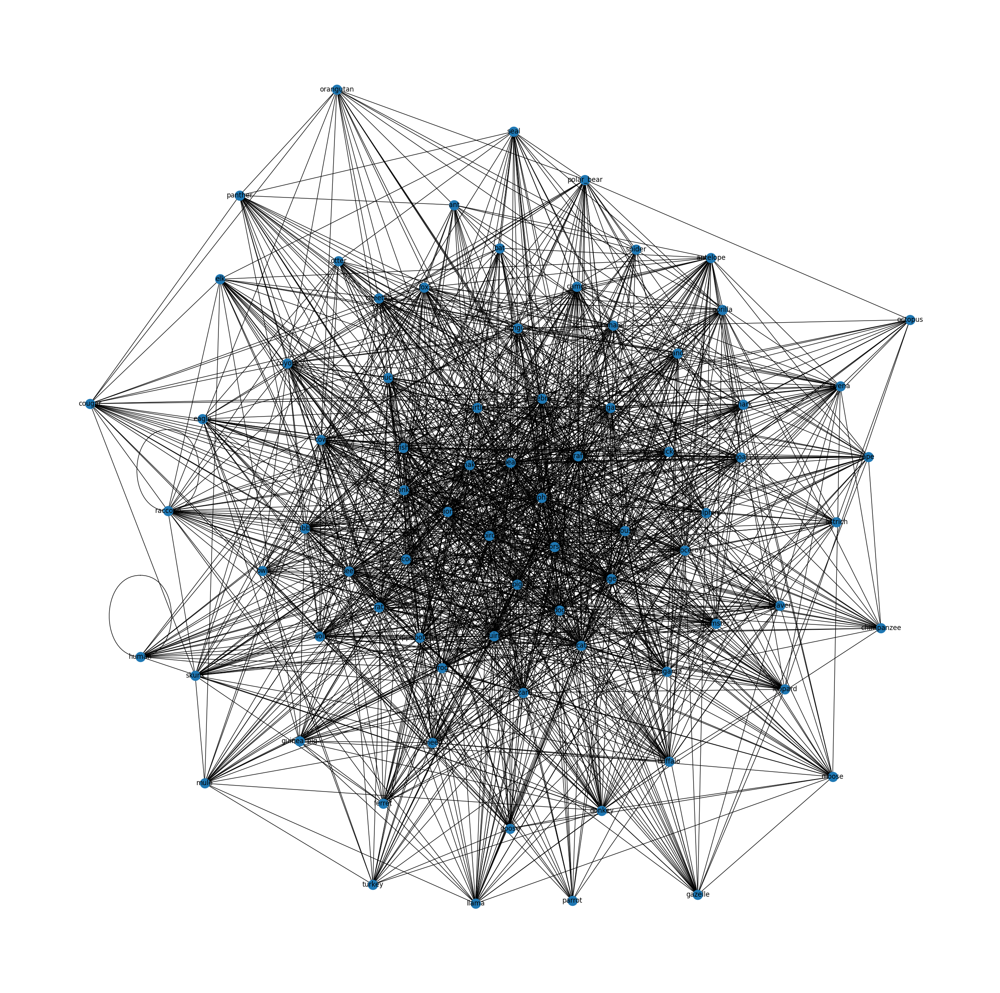

In [12]:
fig, ax = plt.subplots(figsize=(32,32))
nx.draw(animal_pairs, with_labels=True, ax=ax)

plt.show()

In [13]:
connected_list = [x for x in animal_pairs.nodes]

In [14]:
# try the small list, or, failing that, just the apes

In [15]:
smaller_animal_pair_data=animal_pair_data.loc[animal_pair_data['first_animal' ].isin( connected_list) & animal_pair_data['second_animal' ].isin( connected_list) ] 

In [16]:
joined_data=smaller_animal_pair_data.join(raw_dataset).drop(columns='[All_Ratings]')

In [17]:
big_matrix = pd.DataFrame(index=connected_list, columns = connected_list)

In [18]:
joined_data

,first_animal,second_animal,Average_Rating
Pair,,,
alligator~antelope,alligator,antelope,1.940
alligator~bird,alligator,bird,2.080
alligator~buffalo,alligator,buffalo,1.080
alligator~elephant,alligator,elephant,1.140
alligator~fish,alligator,fish,1.000
...,...,...,...
zebra~seal,zebra,seal,1.040
zebra~shark,zebra,shark,1.067
zebra~snake,zebra,snake,1.880


In [19]:
#TODO wrap below section into functions

In [20]:
for row in joined_data.iterrows():
    big_matrix.loc[row[1].first_animal][row[1].second_animal] = row[1].Average_Rating
    big_matrix.loc[row[1].second_animal][row[1].first_animal] = row[1].Average_Rating

In [21]:
big_matrix = big_matrix.astype(float)

In [22]:
# big_matrix = big_matrix[big_matrix.isna().mean(1) < 0.5]
# big_matrix = big_matrix[big_matrix.index.to_list()]

In [23]:
big_matrix = big_matrix[big_matrix.isna().mean(1) < 0.33]

In [24]:
big_matrix = big_matrix[big_matrix.index.to_list()]

In [25]:
plt.matshow(big_matrix)

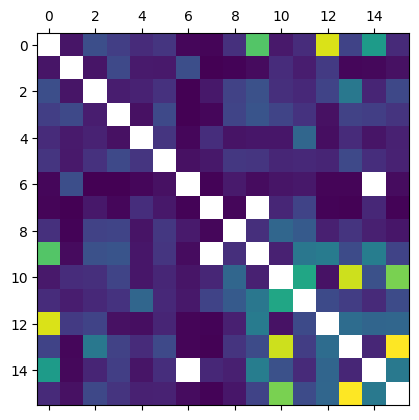

In [26]:
plt.show()

In [27]:
big_matrix.isna().mean(1)

horse       0.0625
snake       0.0625
giraffe     0.0625
bear        0.0625
monkey      0.0625
elephant    0.0625
fish        0.1250
bird        0.1250
pig         0.0625
deer        0.1250
cat         0.0625
dog         0.0625
zebra       0.0625
lion        0.0625
cow         0.1250
tiger       0.0625
dtype: float64

In [28]:
big_matrix.shape

(16, 16)

In [29]:
big_matrix

,horse,snake,giraffe,bear,monkey,elephant,fish,bird,pig,deer,cat,dog,zebra,lion,cow,tiger
horse,NaN,1.30,2.250,1.960,1.64,1.800,1.100,1.08,1.720,4.82,1.360,1.660,5.917,2.040,3.860,1.620
snake,1.300,NaN,1.300,2.160,1.38,1.360,2.260,1.00,1.060,1.16,1.660,1.420,1.880,1.100,1.110,1.240
giraffe,2.250,1.30,NaN,1.425,1.50,1.740,1.020,1.34,2.020,2.30,1.700,1.600,2.040,3.100,1.540,2.125
bear,1.960,2.16,1.425,NaN,1.24,2.160,1.000,1.10,2.080,2.36,2.080,1.760,1.240,2.020,1.960,1.780
monkey,1.640,1.38,1.500,1.240,NaN,1.810,1.100,1.68,1.280,1.32,1.320,2.720,1.200,1.640,1.290,1.480
elephant,1.800,1.36,1.740,2.160,1.81,NaN,1.240,1.34,1.840,1.80,1.560,1.600,1.550,2.160,1.683,1.500
fish,1.100,2.26,1.020,1.000,1.10,1.240,NaN,1.06,1.370,1.18,1.300,1.340,1.080,1.067,NaN,1.180
bird,1.080,1.00,1.340,1.100,1.68,1.340,1.060,NaN,1.100,NaN,1.560,2.050,1.060,1.040,1.580,1.060
pig,1.720,1.06,2.020,2.080,1.28,1.840,1.370,1.10,NaN,1.70,2.717,2.480,1.460,1.780,1.460,1.320
deer,4.820,1.16,2.300,2.360,1.32,1.800,1.180,NaN,1.700,NaN,1.480,3.060,3.180,2.200,3.220,2.040


In [30]:
# todo make into function
similarities = big_matrix.to_numpy()
similarity_vec = np.tril(similarities, -1)
similarity_vec = similarity_vec[np.nonzero(similarity_vec)]

In [31]:
# FIll in NA's 

In [32]:
similarity_vec = np.nan_to_num(similarity_vec, nan=min(similarity_vec))

In [33]:
dissimilarity_vec = np.exp(-1*similarity_vec)
dissimilarity_vec/=np.linalg.norm(dissimilarity_vec)

In [34]:
len(dissimilarity_vec) 
# :=Y  = n(n-1)/2
# 2Y = n^2 - n
# 0 = n^2 - n - 2Y

# 0 = (n - 1/2) ^2 - 1/4 - 2Y 
# 2Y + 1/4 = (n - 1/2)^2
# N = 1/2 + sqrt(2Y + 1/4)


120

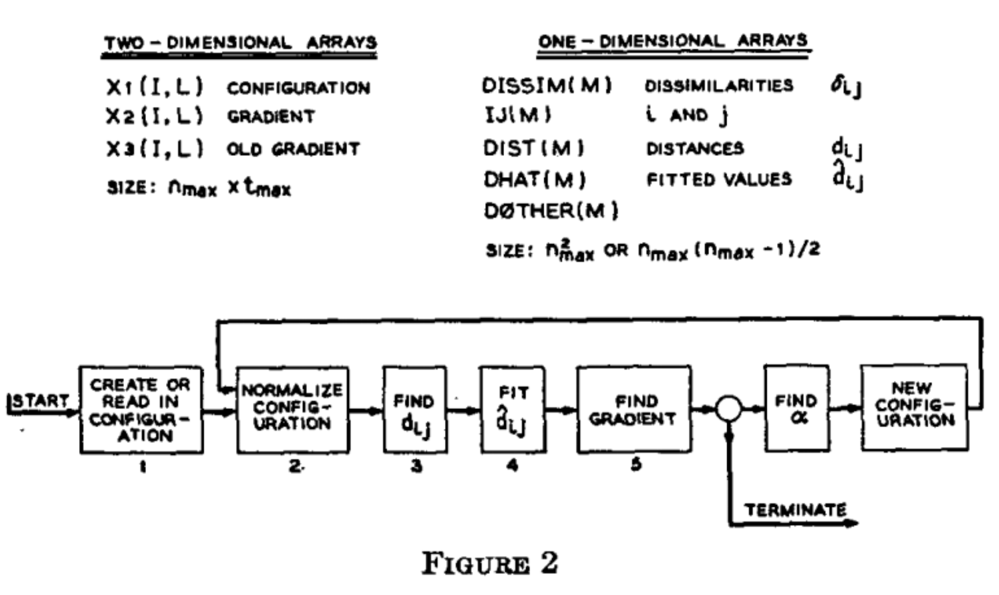
From Kruskal, 1964

Idea is to follow these steps, 

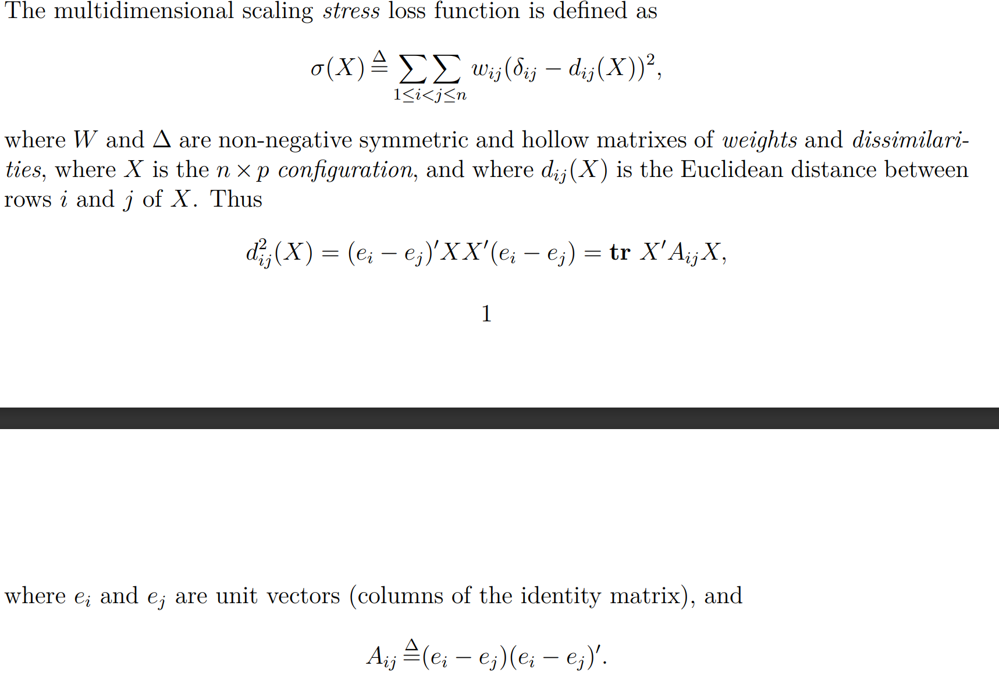
From https://jansweb.netlify.app/publication/deleeuw-e-18-c/
NB: $\delta_{ij}$ here is the true dissimilarity between $i$ and $j$ 

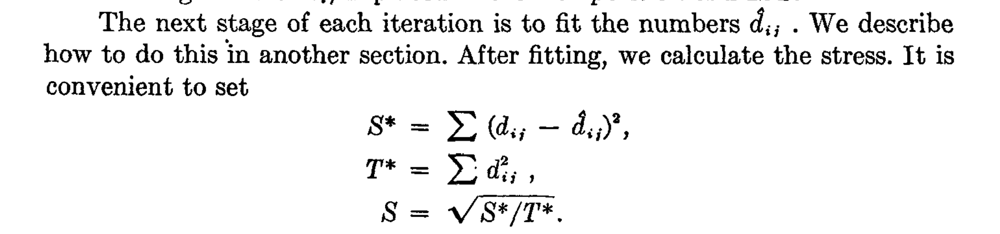
Stress Loss function from Kruskal, 1964

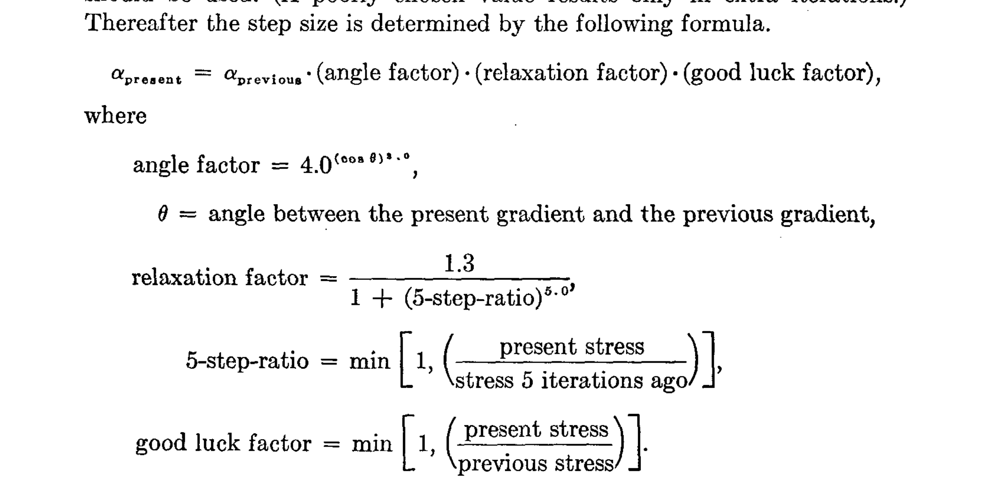
Optimizer from Kruskal, 1964

In [35]:
## Steps 
### Define configuration 
#### for each training iteration
#### normalize 
#### find pairwise distances
#### monotone regression
#### gradient descent



2022-09-01 04:03:13.146 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.5338798045338042
2022-09-01 04:03:13.148 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:03:13.154 | INFO     | src.autograd_mds:my_mds_training_loop:217 - Starting Stress: 0.7306707908037684
2022-09-01 04:03:13.192 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 0.5338798045338042
2022-09-01 04:03:13.194 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:03:13.377 | INFO     | src.autograd_mds:my_mds_training_loop:220 - Starting Gradient magnitude: 0.7167843993780939


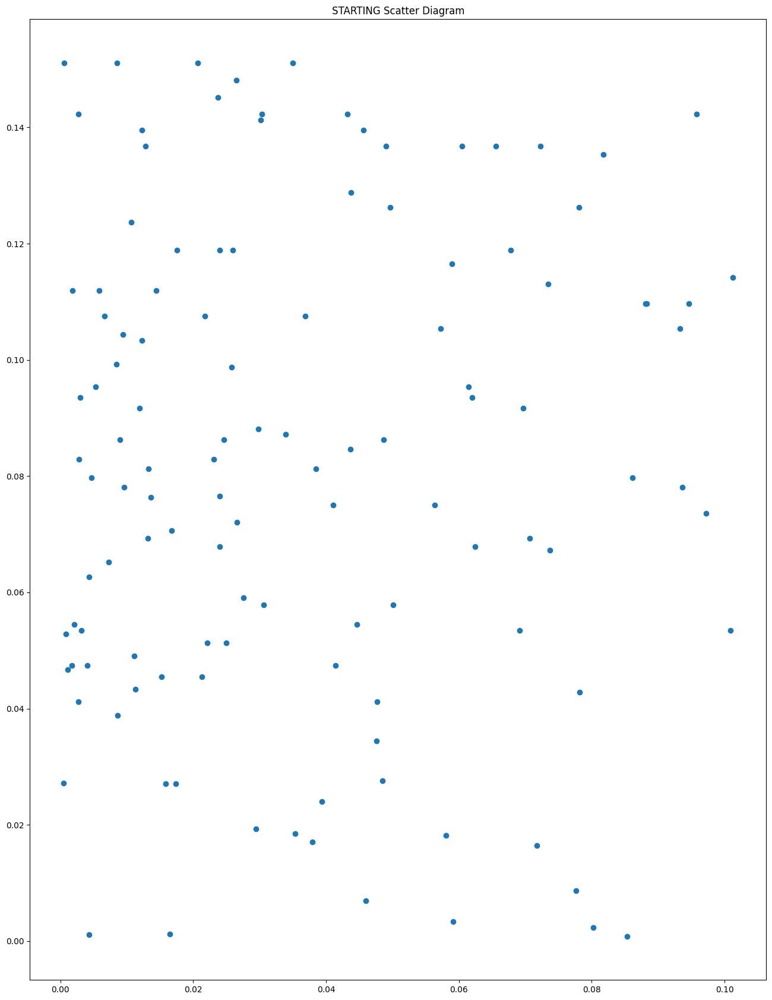

/usr/local/lib/python3.8/dist-packages/numpy/core/numeric.py:2457: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  a1, a2 = asarray(a1), asarray(a2)
2022-09-01 04:03:14.138 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.1452853270056967
2022-09-01 04:03:14.140 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:03:14.142 | INFO     | src.autograd_mds:my_mds_training_loop:238 - stress: 0.38116312387965434
2022-09-01 04:03:14.180 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 0.5338798045338042
2022-09-01 04:03:14.182 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:03:14.217 | INFO     | src.autograd_mds:my_mds_training_loop:244 - Gradient magnitude: 0.7167843993780939


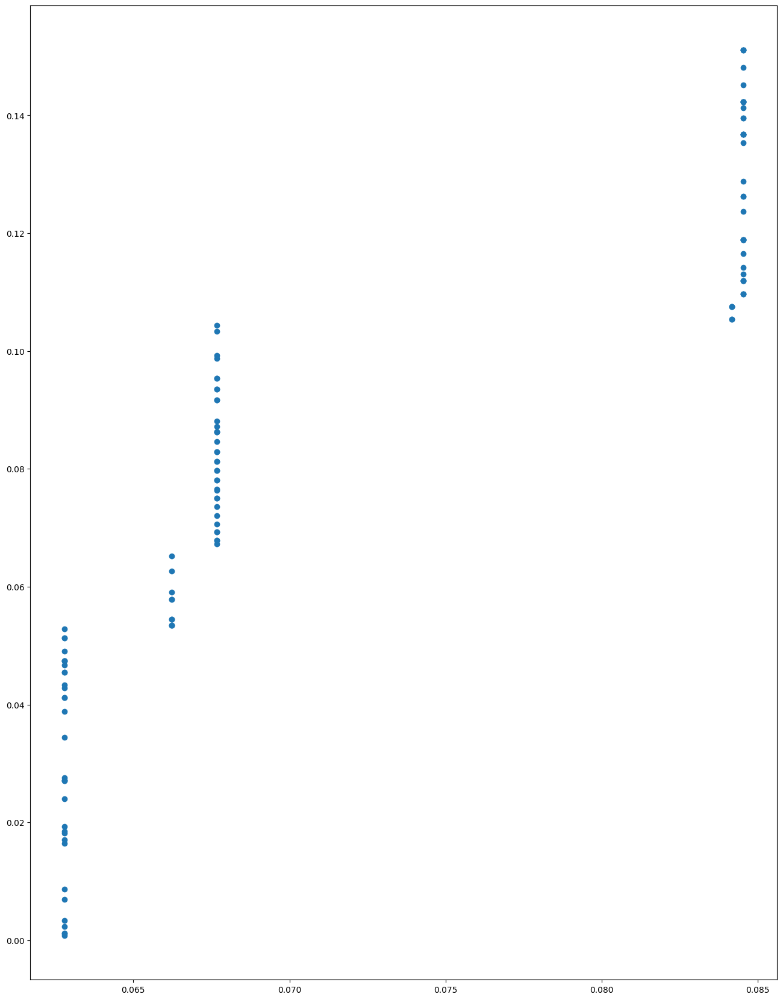

2022-09-01 04:03:14.837 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.11406558139511287
2022-09-01 04:03:14.838 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:03:14.839 | INFO     | src.autograd_mds:my_mds_training_loop:238 - stress: 0.3377359640238405
2022-09-01 04:03:14.878 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 470176.9297181477
2022-09-01 04:03:14.880 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:03:14.922 | INFO     | src.autograd_mds:my_mds_training_loop:244 - Gradient magnitude: 87.34958972838729


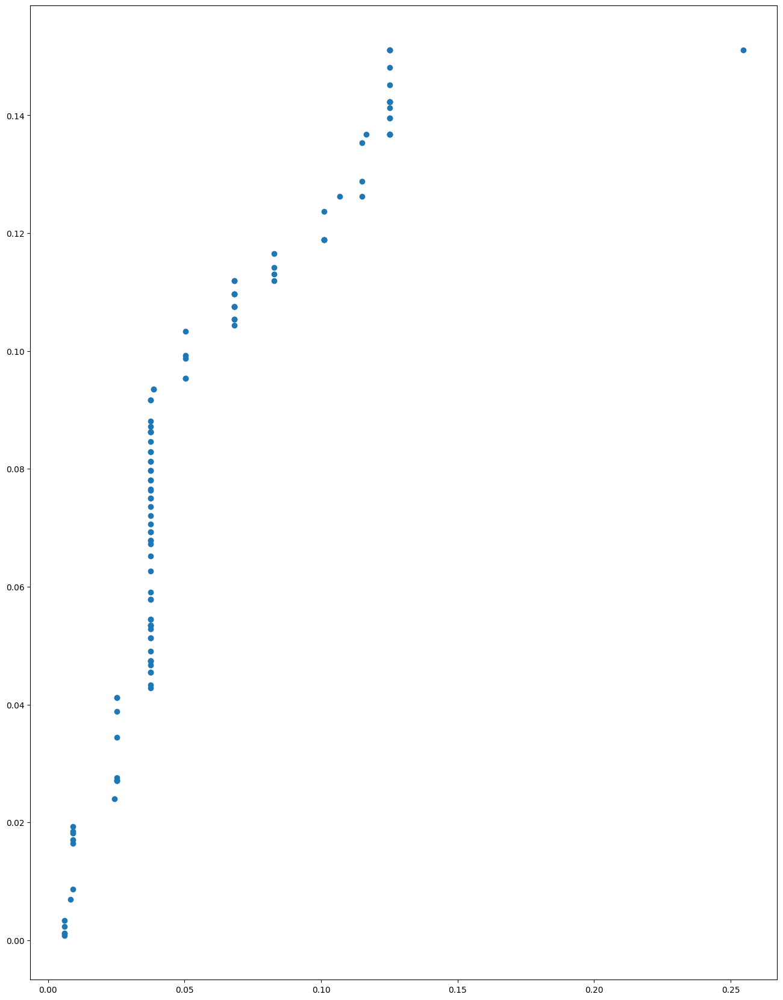

2022-09-01 04:03:15.457 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.29676352758351454
2022-09-01 04:03:15.459 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:03:15.460 | INFO     | src.autograd_mds:my_mds_training_loop:238 - stress: 0.5447600642333417
2022-09-01 04:03:15.493 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 5.233334236351514e+52
2022-09-01 04:03:15.495 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0


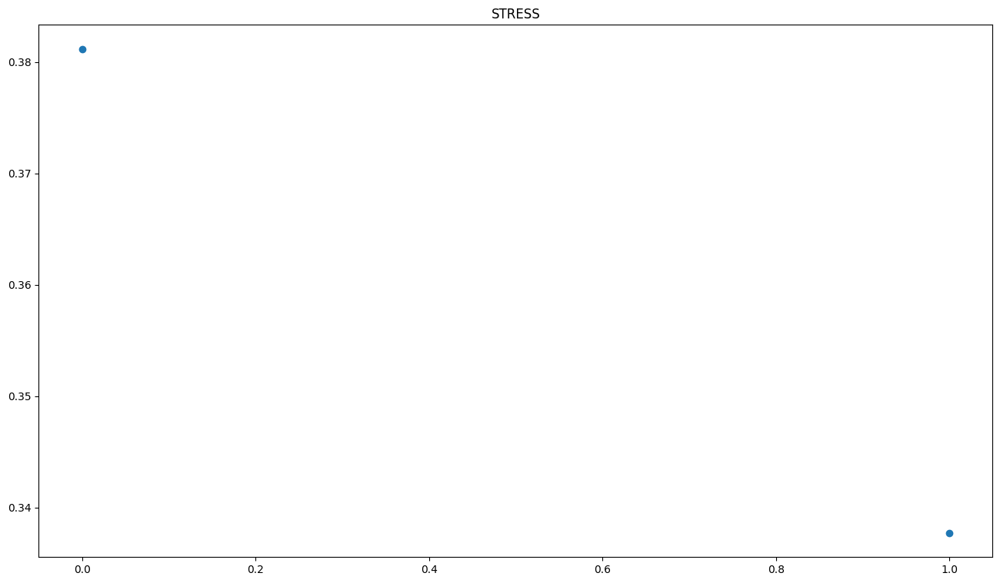

2022-09-01 04:03:15.762 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.6375227897244696
2022-09-01 04:03:15.765 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:03:15.768 | INFO     | src.autograd_mds:my_mds_training_loop:217 - Starting Stress: 0.7984502424850716
2022-09-01 04:03:15.801 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 0.6375227897244696
2022-09-01 04:03:15.803 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:03:15.830 | INFO     | src.autograd_mds:my_mds_training_loop:220 - Starting Gradient magnitude: 0.8302889328246691


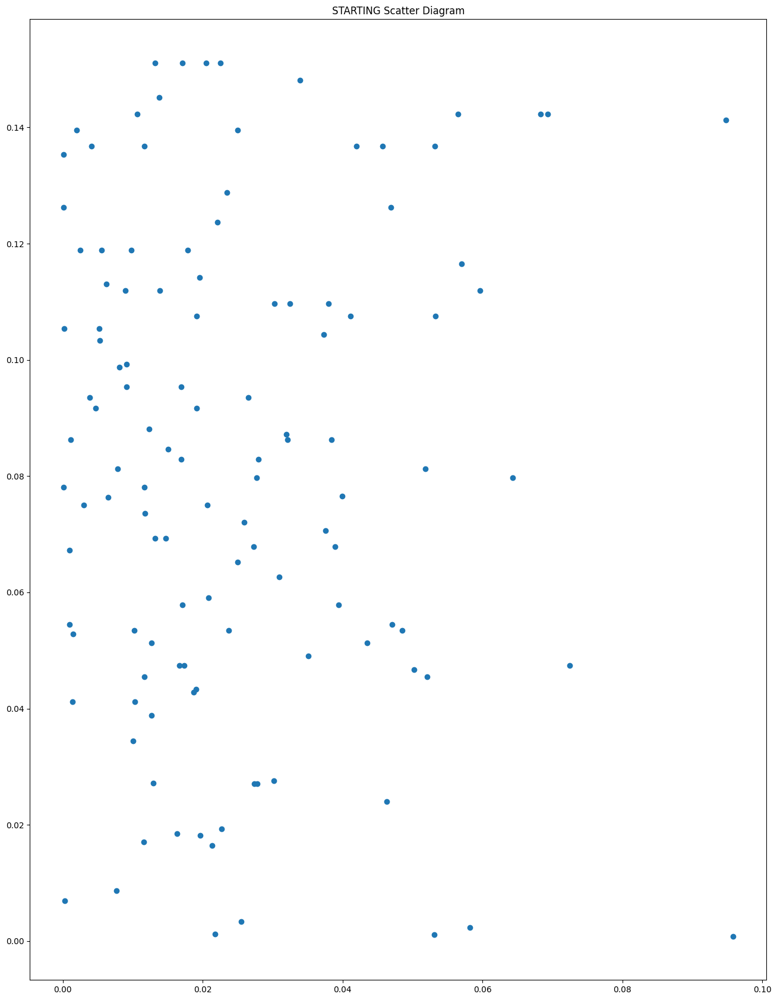

2022-09-01 04:03:16.411 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.16097581579901254
2022-09-01 04:03:16.413 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:03:16.414 | INFO     | src.autograd_mds:my_mds_training_loop:238 - stress: 0.4012179156007525
2022-09-01 04:03:16.447 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 0.6375227897244696
2022-09-01 04:03:16.449 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:03:16.492 | INFO     | src.autograd_mds:my_mds_training_loop:244 - Gradient magnitude: 0.8302889328246691


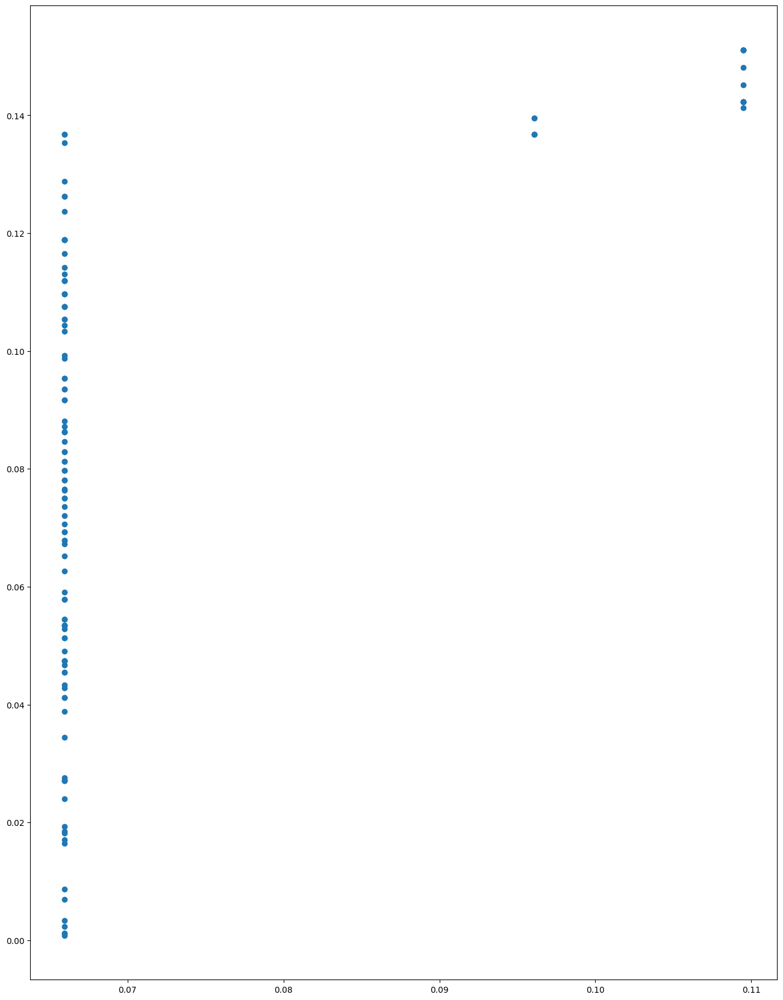

2022-09-01 04:03:17.213 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.12628249670387115
2022-09-01 04:03:17.216 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:03:17.218 | INFO     | src.autograd_mds:my_mds_training_loop:238 - stress: 0.3553624863486172
2022-09-01 04:03:17.259 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 1117890.7010156903
2022-09-01 04:03:17.262 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:03:17.300 | INFO     | src.autograd_mds:my_mds_training_loop:244 - Gradient magnitude: 105.35153369398441


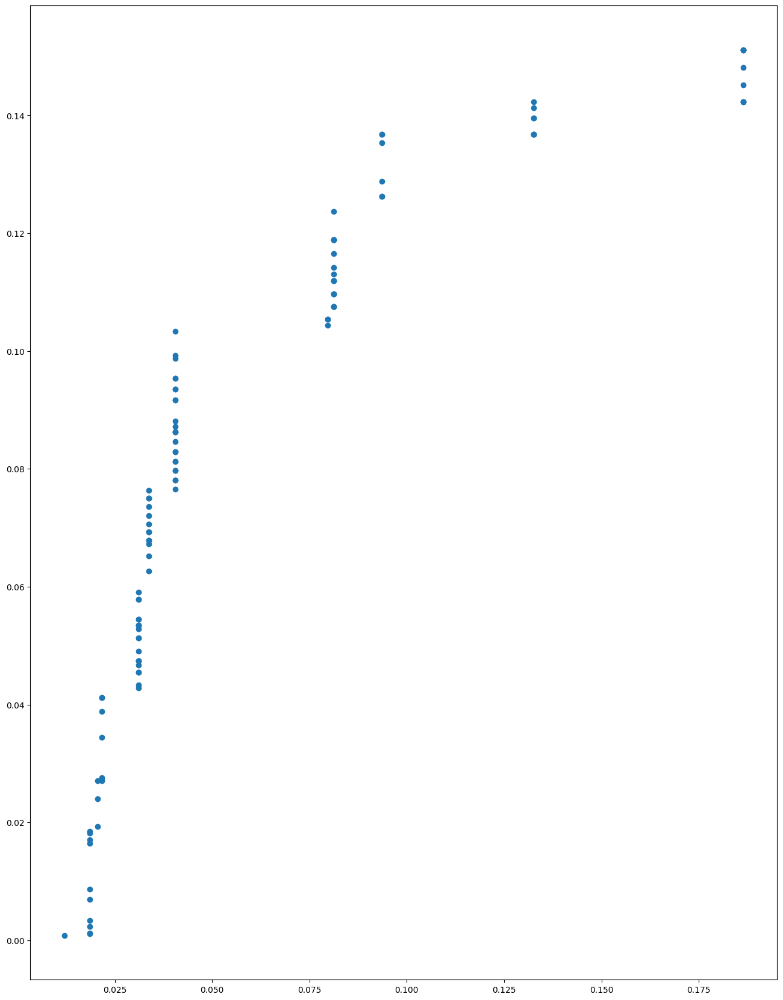

2022-09-01 04:03:17.972 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.2818172421754622
2022-09-01 04:03:17.974 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:03:17.976 | INFO     | src.autograd_mds:my_mds_training_loop:238 - stress: 0.5308646175584338
2022-09-01 04:03:18.008 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 4.796526470370099e+62
2022-09-01 04:03:18.010 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0


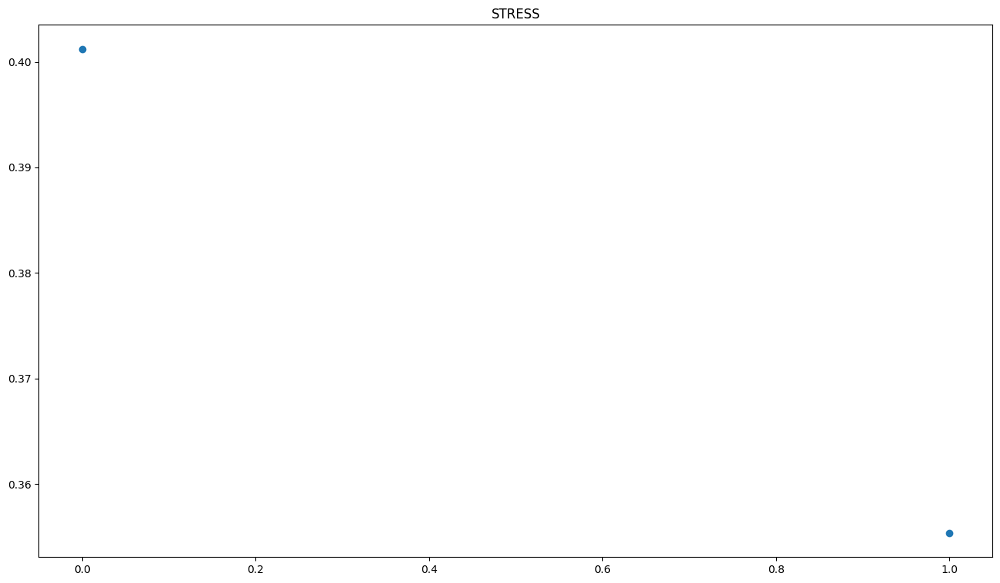

2022-09-01 04:03:18.349 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.5290350102109987
2022-09-01 04:03:18.351 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:03:18.356 | INFO     | src.autograd_mds:my_mds_training_loop:217 - Starting Stress: 0.7273479292683789
2022-09-01 04:03:18.395 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 0.5290350102109987
2022-09-01 04:03:18.397 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:03:18.461 | INFO     | src.autograd_mds:my_mds_training_loop:220 - Starting Gradient magnitude: 0.6969111290812392


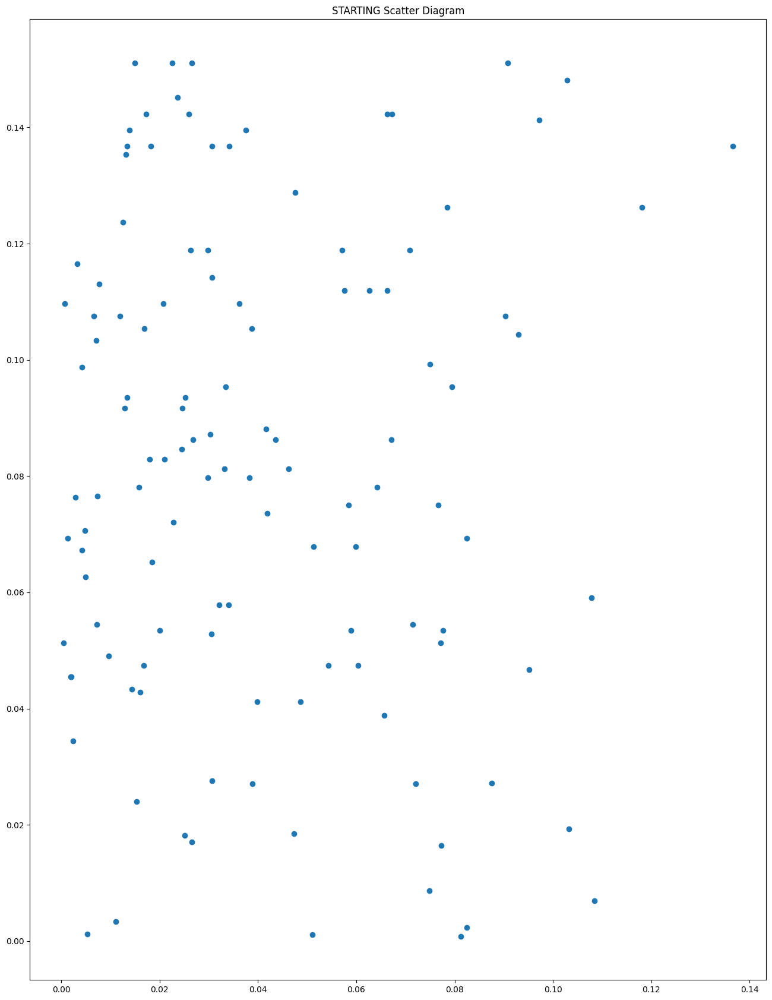

2022-09-01 04:03:19.076 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.17336443005696672
2022-09-01 04:03:19.077 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:03:19.079 | INFO     | src.autograd_mds:my_mds_training_loop:238 - stress: 0.41637054417545766
2022-09-01 04:03:19.111 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 0.5290350102109987
2022-09-01 04:03:19.113 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:03:19.156 | INFO     | src.autograd_mds:my_mds_training_loop:244 - Gradient magnitude: 0.6969111290812392


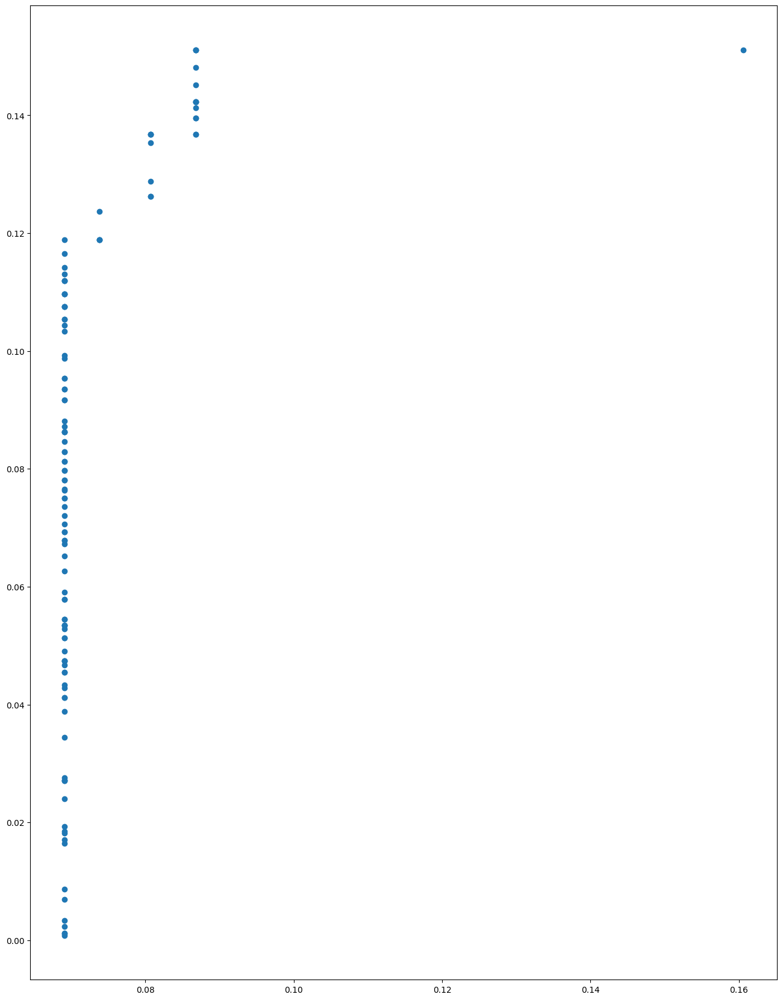

2022-09-01 04:03:19.820 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.16199405653651064
2022-09-01 04:03:19.822 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:03:19.823 | INFO     | src.autograd_mds:my_mds_training_loop:238 - stress: 0.40248485255536093
2022-09-01 04:03:19.853 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 674765.0411583297
2022-09-01 04:03:19.857 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:03:19.886 | INFO     | src.autograd_mds:my_mds_training_loop:244 - Gradient magnitude: 97.27072629406211


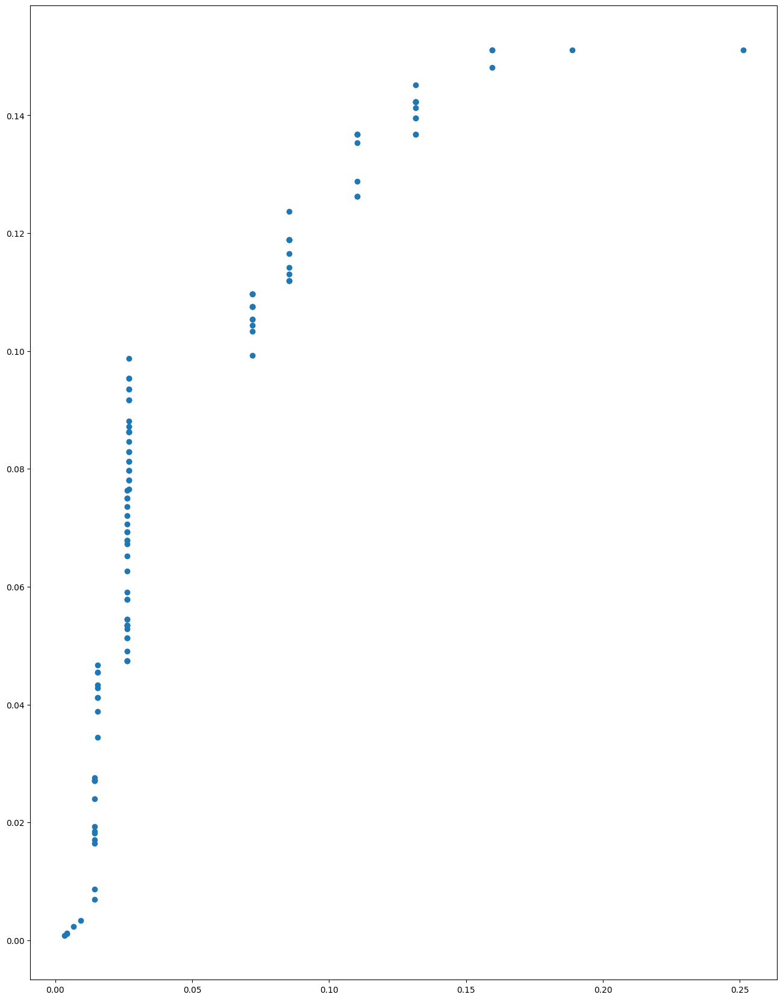

2022-09-01 04:03:20.493 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.2931117078511818
2022-09-01 04:03:20.495 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:03:20.497 | INFO     | src.autograd_mds:my_mds_training_loop:238 - stress: 0.5413979200654374
2022-09-01 04:03:20.533 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 2.865246818034755e+56
2022-09-01 04:03:20.535 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0


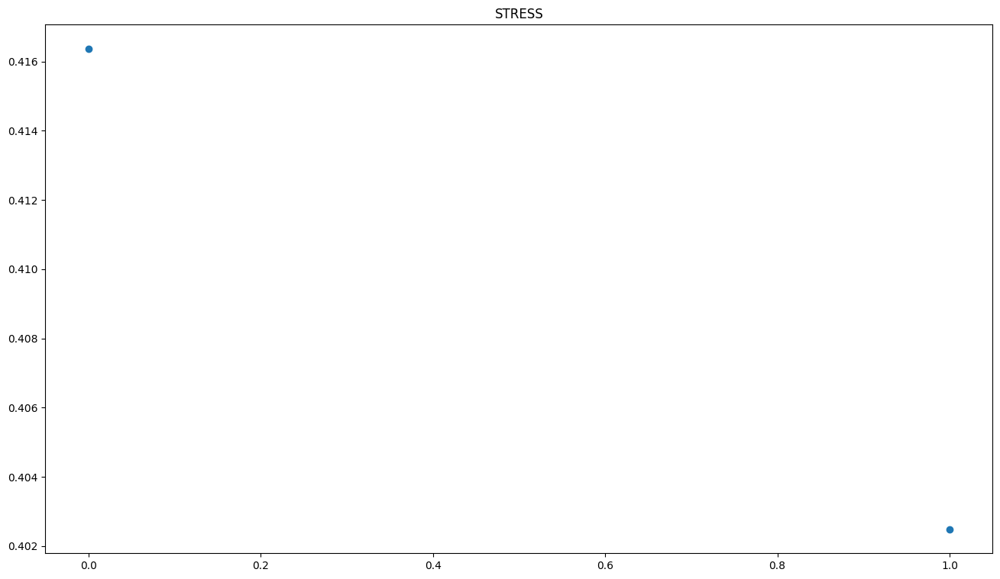

2022-09-01 04:03:20.797 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.6619406370549846
2022-09-01 04:03:20.799 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:03:20.800 | INFO     | src.autograd_mds:my_mds_training_loop:217 - Starting Stress: 0.8135973433185391
2022-09-01 04:03:20.834 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 0.6619406370549846
2022-09-01 04:03:20.836 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:03:20.866 | INFO     | src.autograd_mds:my_mds_training_loop:220 - Starting Gradient magnitude: 0.6421196750161823


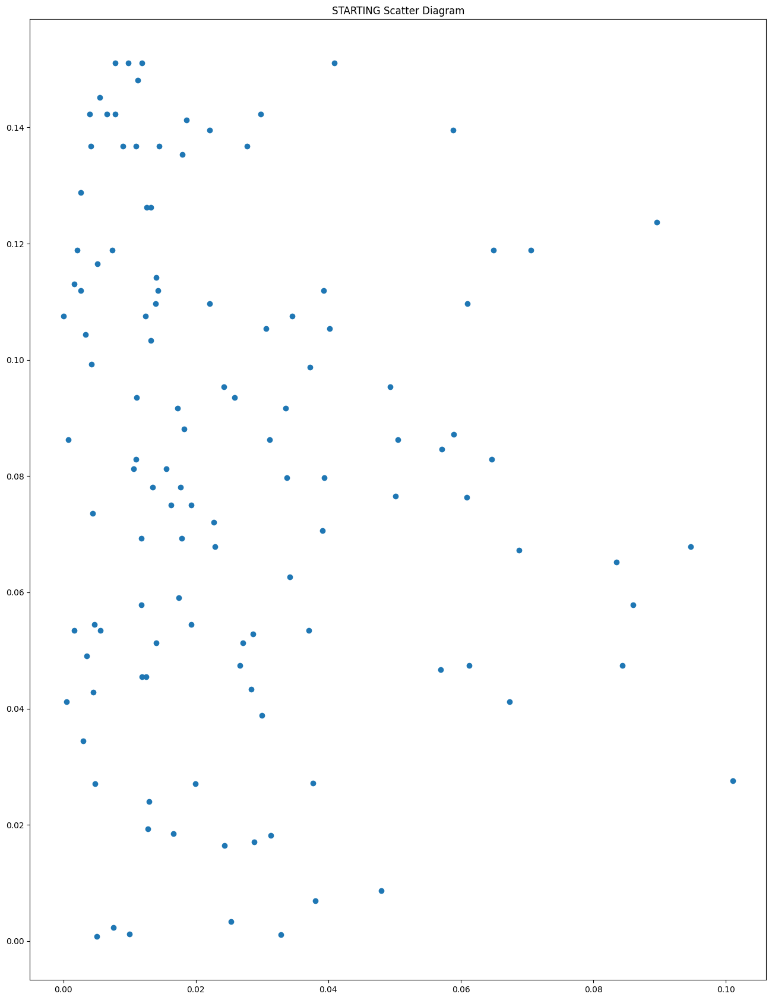

2022-09-01 04:03:21.511 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.19376255190907649
2022-09-01 04:03:21.512 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:03:21.514 | INFO     | src.autograd_mds:my_mds_training_loop:238 - stress: 0.44018467932116456
2022-09-01 04:03:21.552 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 0.6619406370549846
2022-09-01 04:03:21.554 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:03:21.583 | INFO     | src.autograd_mds:my_mds_training_loop:244 - Gradient magnitude: 0.6421196750161823


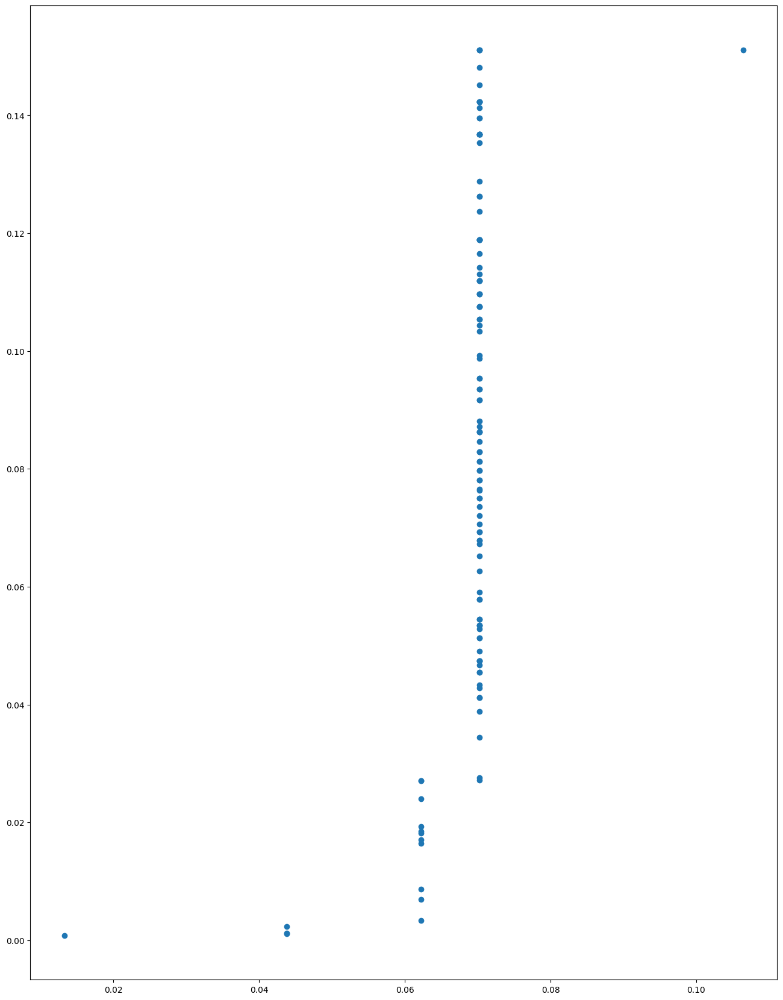

2022-09-01 04:03:22.261 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.08235437183515179
2022-09-01 04:03:22.263 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:03:22.264 | INFO     | src.autograd_mds:my_mds_training_loop:238 - stress: 0.2869745142606775
2022-09-01 04:03:22.298 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 219124.8456294487
2022-09-01 04:03:22.299 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:03:22.337 | INFO     | src.autograd_mds:my_mds_training_loop:244 - Gradient magnitude: 67.23572686652356


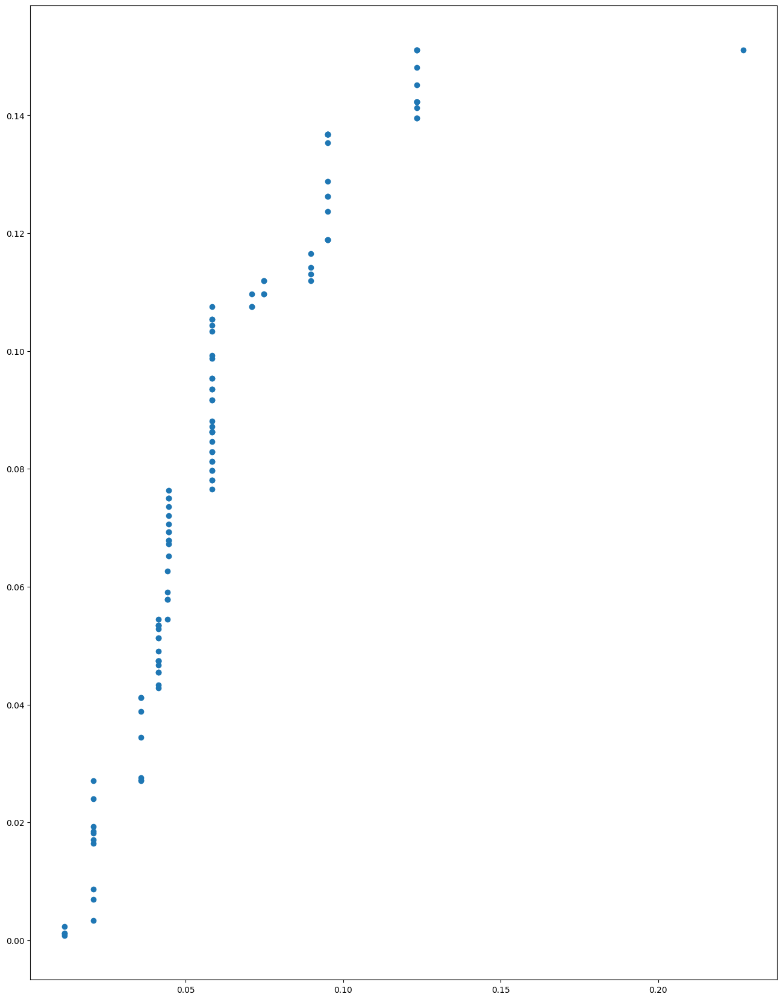

2022-09-01 04:03:22.906 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.17424622108603402
2022-09-01 04:03:22.908 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:03:22.909 | INFO     | src.autograd_mds:my_mds_training_loop:238 - stress: 0.41742810289441945
2022-09-01 04:03:22.944 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 4.9345215343312195e+44
2022-09-01 04:03:22.946 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0


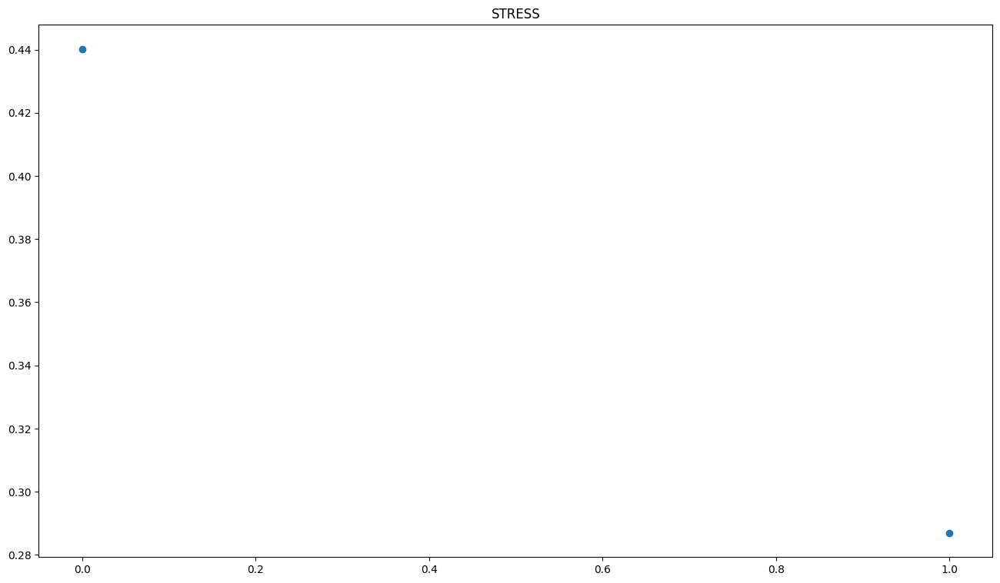

2022-09-01 04:03:23.259 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.5445478479401725
2022-09-01 04:03:23.261 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:03:23.264 | INFO     | src.autograd_mds:my_mds_training_loop:217 - Starting Stress: 0.7379348534526422
2022-09-01 04:03:23.311 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 0.5445478479401725
2022-09-01 04:03:23.313 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:03:23.346 | INFO     | src.autograd_mds:my_mds_training_loop:220 - Starting Gradient magnitude: 0.7795502142266301


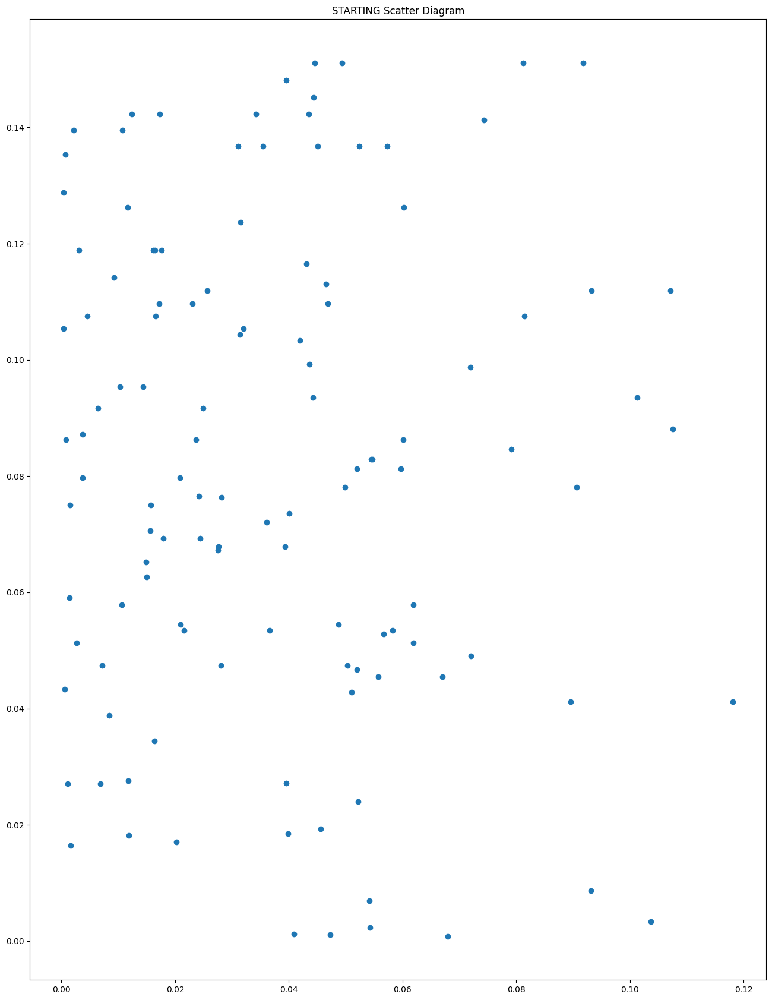

2022-09-01 04:03:23.988 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.19030393725258932
2022-09-01 04:03:23.991 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:03:23.995 | INFO     | src.autograd_mds:my_mds_training_loop:238 - stress: 0.43623839497755046
2022-09-01 04:03:24.026 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 0.5445478479401725
2022-09-01 04:03:24.032 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:03:24.068 | INFO     | src.autograd_mds:my_mds_training_loop:244 - Gradient magnitude: 0.7795502142266301


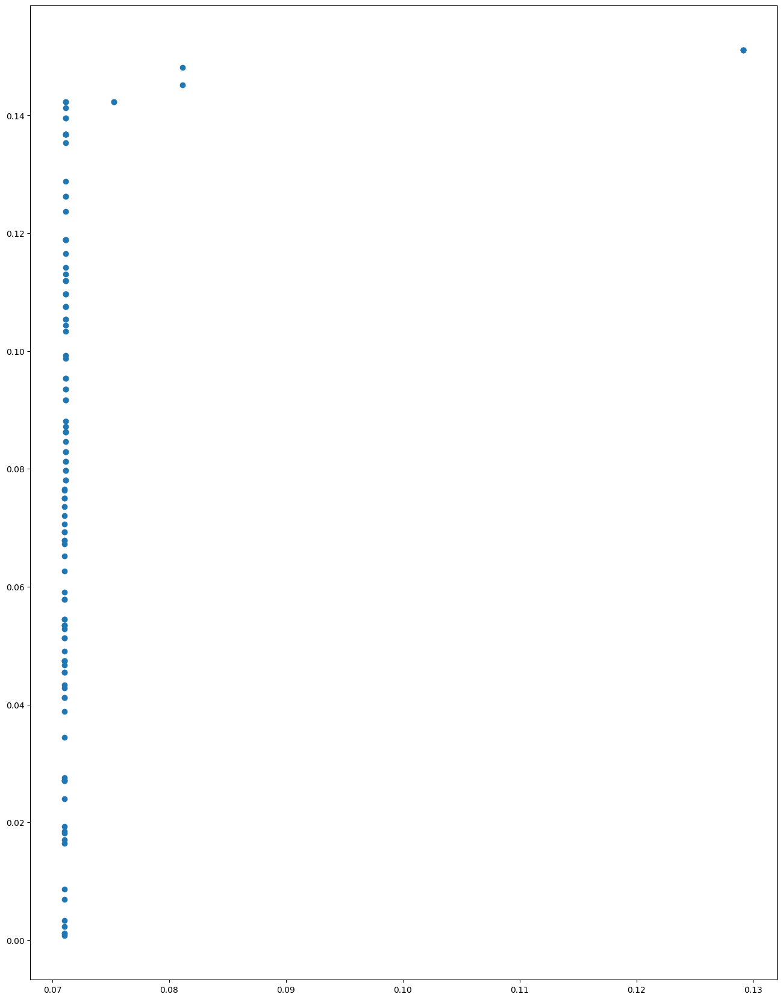

2022-09-01 04:03:24.795 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.16406342734392085
2022-09-01 04:03:24.797 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:03:24.798 | INFO     | src.autograd_mds:my_mds_training_loop:238 - stress: 0.4050474383870621
2022-09-01 04:03:24.827 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 1470910.6757527734
2022-09-01 04:03:24.829 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:03:24.876 | INFO     | src.autograd_mds:my_mds_training_loop:244 - Gradient magnitude: 110.79762005248843


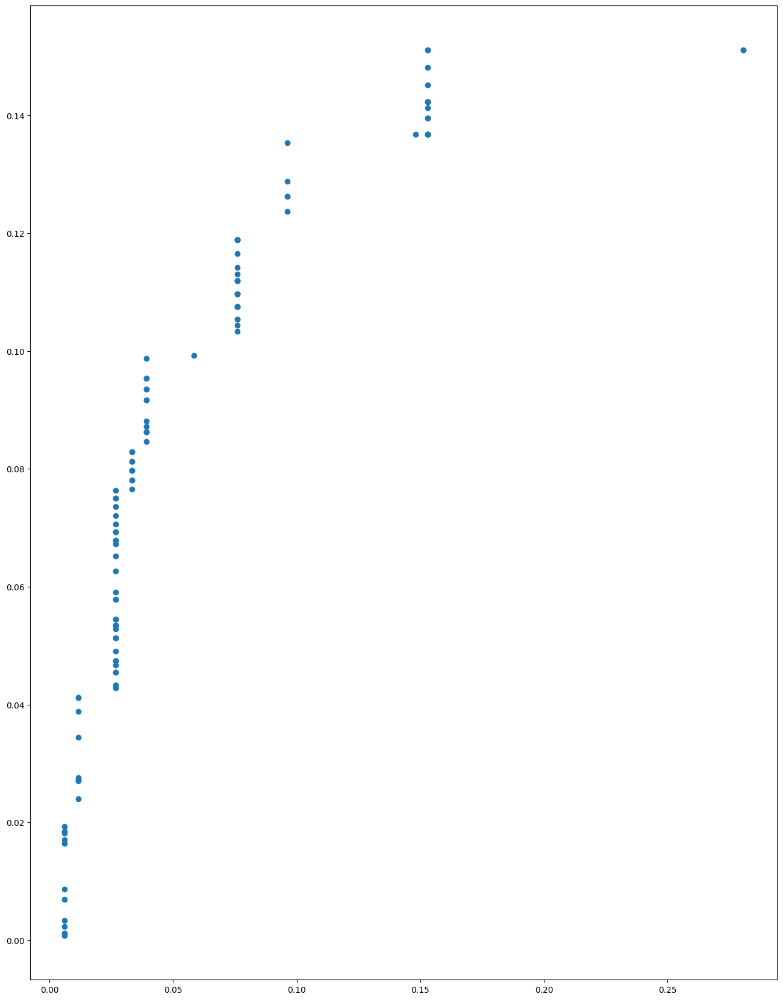

2022-09-01 04:03:25.534 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.2466338153672877
2022-09-01 04:03:25.536 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:03:25.538 | INFO     | src.autograd_mds:my_mds_training_loop:238 - stress: 0.49662240723439743
2022-09-01 04:03:25.569 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 6.532754924768556e+64
2022-09-01 04:03:25.571 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0


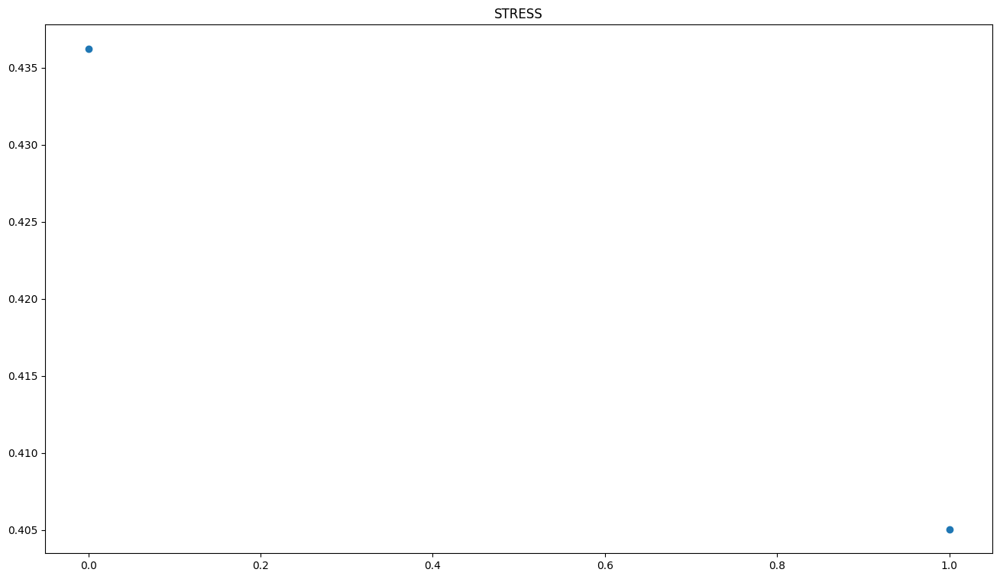

In [36]:
loop_config = my_mds_training_loop(dissimilarity_vec, n_init=5,eps =.01,dim=2)

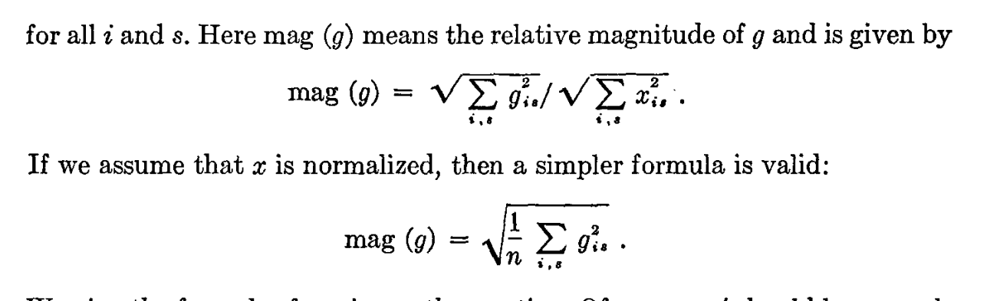

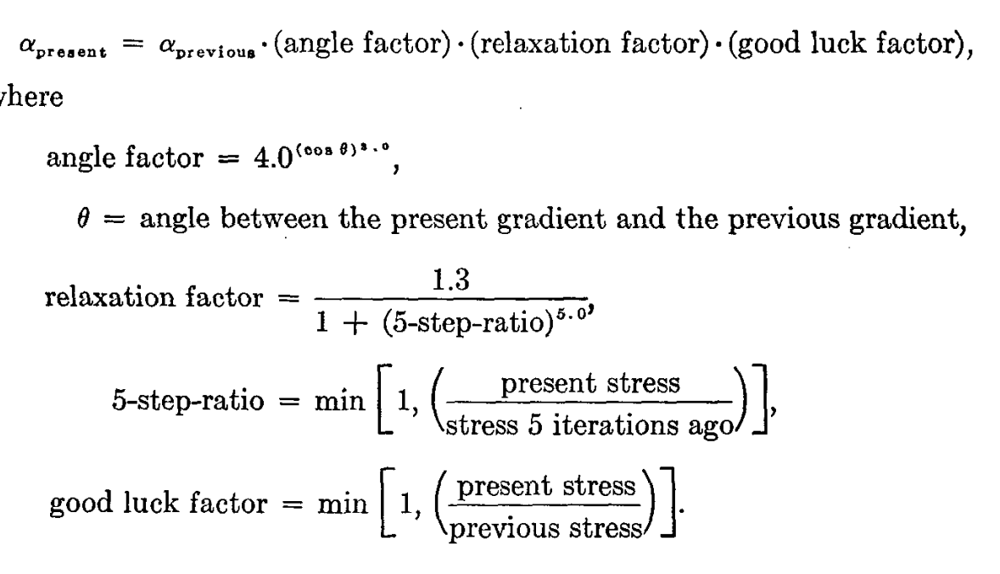

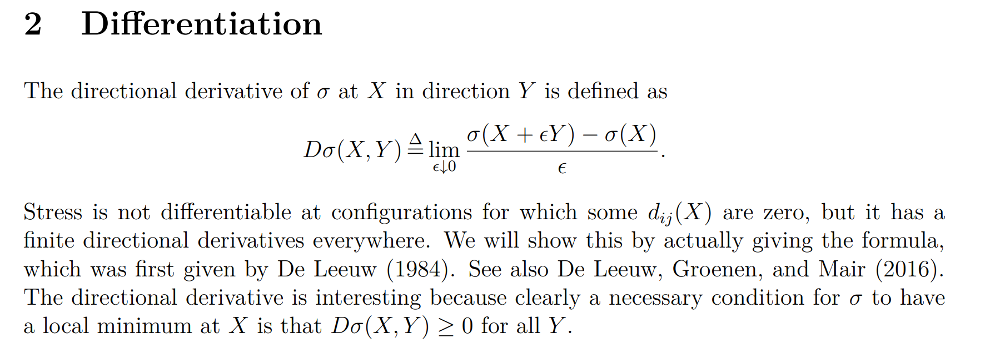
From https://jansweb.netlify.app/publication/deleeuw-e-18-c/

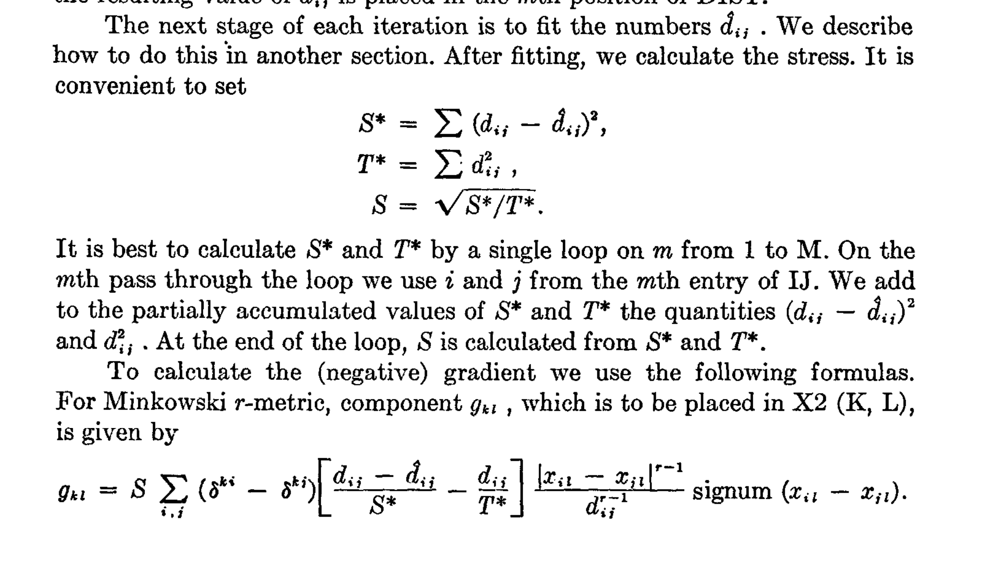
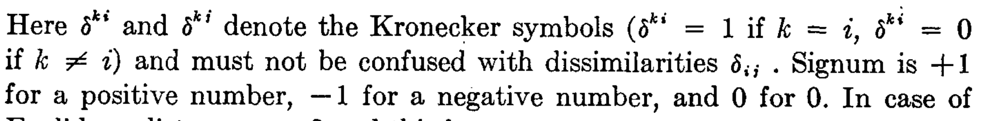
From Kruskal, 1964

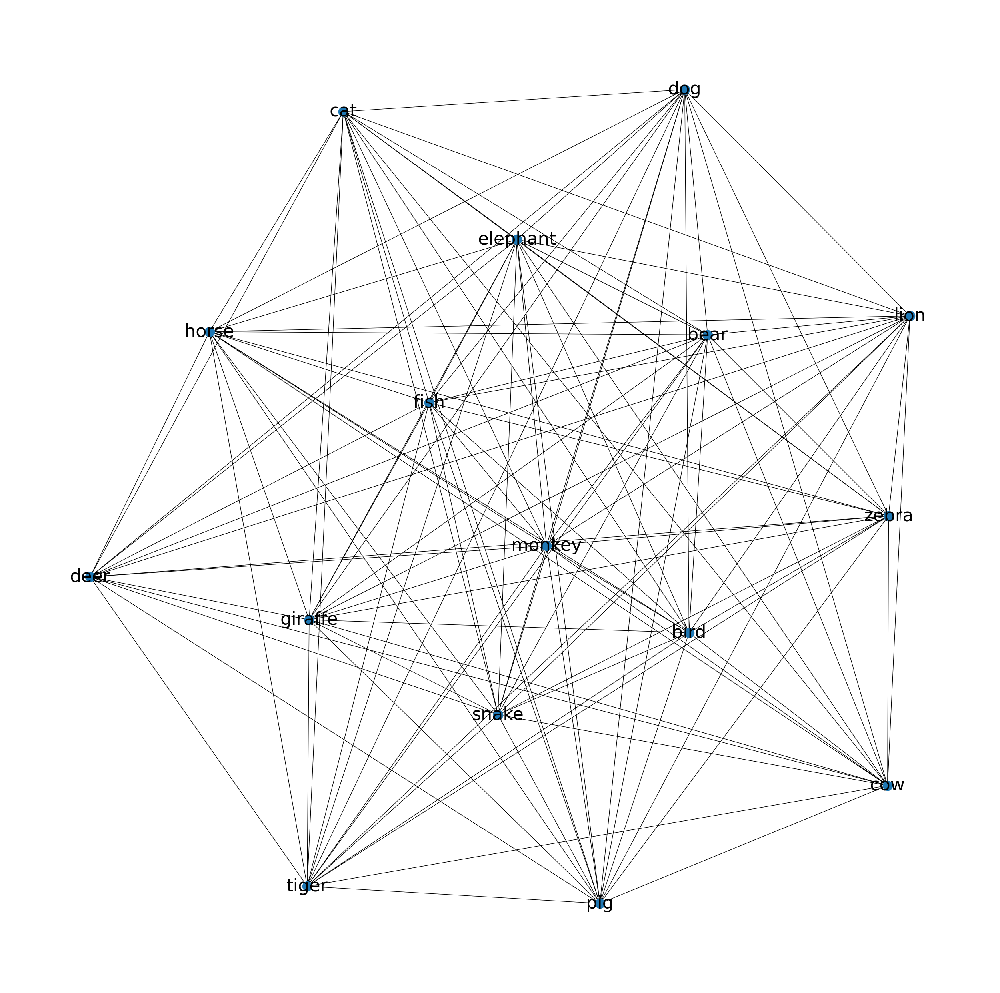

In [37]:
fig, ax = plt.subplots(figsize=(32,32))
nx.draw(animal_pairs.subgraph(big_matrix.index.to_list()), with_labels=True, ax=ax, font_size=32,
       pos=nx.spring_layout(animal_pairs.subgraph(big_matrix.index.to_list())))

plt.show()

In [38]:
refMDS = MDS(dissimilarity="precomputed",metric=False,)

In [39]:
dissimilarity_mat = np.exp(-1*np.nan_to_num(similarities)) - np.eye(similarities.shape[0])

In [40]:
plt.matshow(dissimilarity_mat)

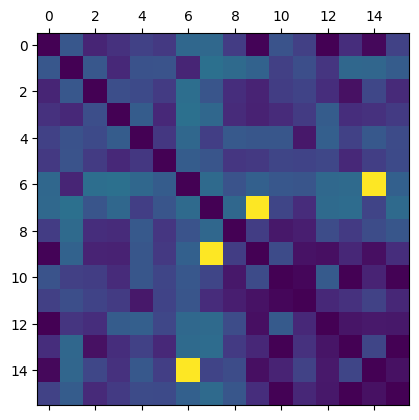

In [41]:
plt.show()

In [42]:
new_config = refMDS.fit_transform(dissimilarity_mat)

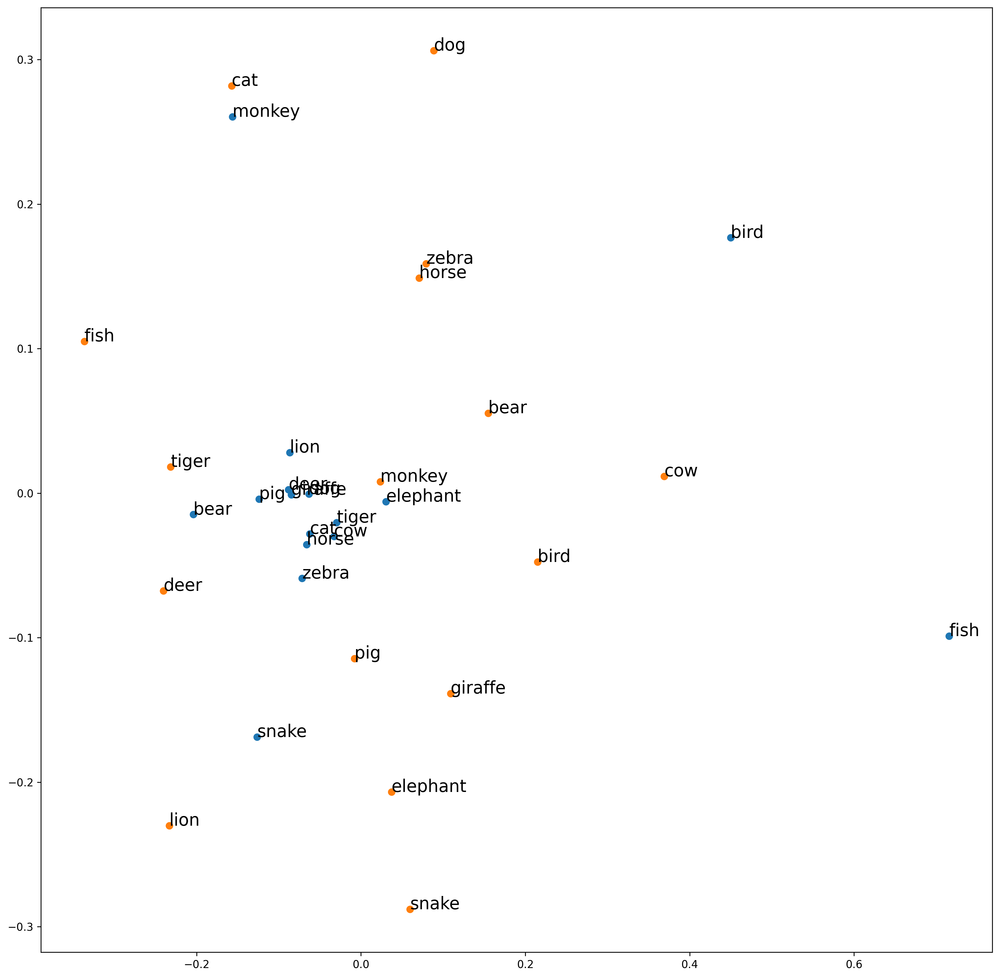

In [43]:
new_config /= np.sqrt((new_config**2).sum())
loop_config /= np.sqrt((loop_config**2).sum())
# Rotate the data
clf = PCA(n_components=2)

new_config = clf.fit_transform(new_config)
loop_config = clf.fit_transform(loop_config)

fig, ax = plt.subplots(figsize=(16,16), dpi=300)
ax.scatter(x=loop_config[:,0], y=loop_config[:,1])
for i, label in enumerate(big_matrix.index.to_list()):
       ax.annotate(label, (loop_config[i,0], loop_config[i,1]), fontsize=16)

# ax.set_yscale('log')
# ax.set_xscale('log')

ax.scatter(x=new_config[:,0], y=new_config[:,1])
for i, label in enumerate(big_matrix.index.to_list()):
       ax.annotate(label, (new_config[i,0], new_config[i,1]), fontsize=16)

# ax.set_yscale('log')
# ax.set_xscale('log')
plt.show()

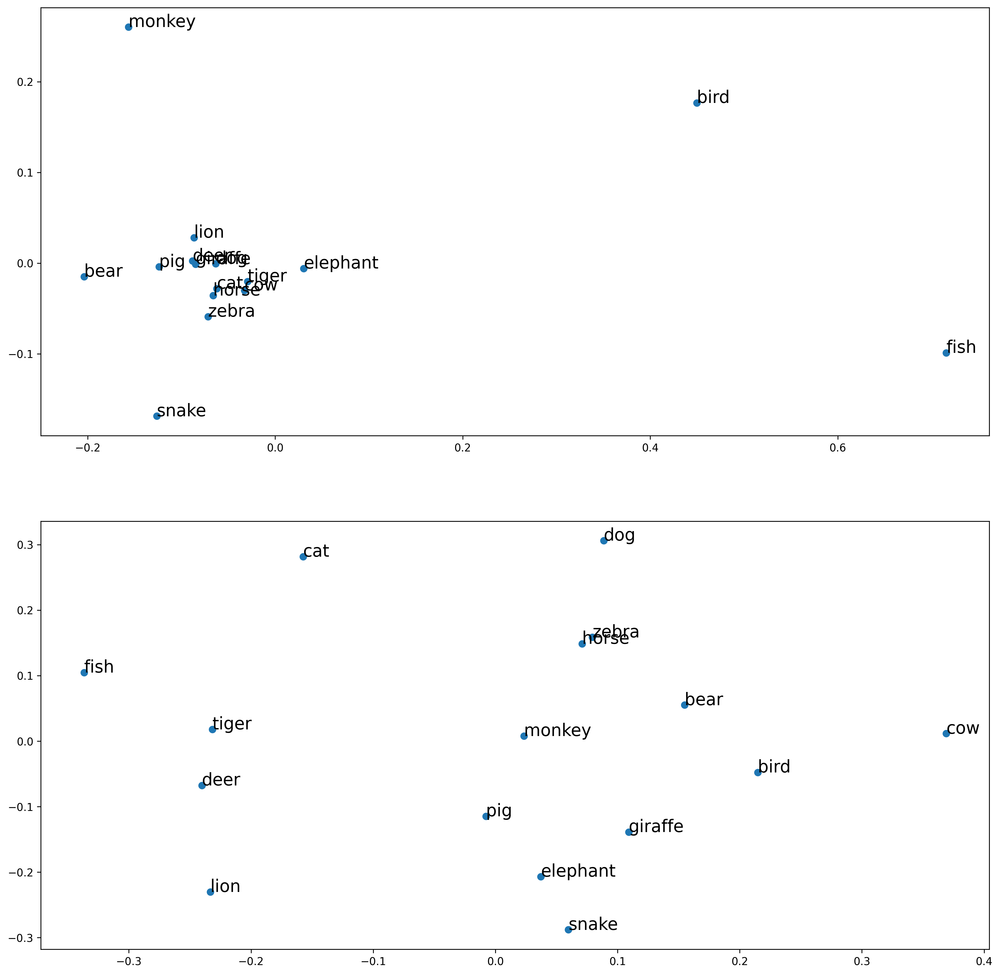

In [44]:
new_config /= np.sqrt((new_config**2).sum())
loop_config /= np.sqrt((loop_config**2).sum())
# Rotate the data
clf = PCA(n_components=2)

new_config = clf.fit_transform(new_config)
loop_config = clf.fit_transform(loop_config)

fig, ax = plt.subplots(2,1,figsize=(16,16), dpi=300)
ax[0].scatter(x=loop_config[:,0], y=loop_config[:,1])
for i, label in enumerate(big_matrix.index.to_list()):
       ax[0].annotate(label, (loop_config[i,0], loop_config[i,1]), fontsize=16)

# ax.set_yscale('log')
# ax.set_xscale('log')

ax[1].scatter(x=new_config[:,0], y=new_config[:,1])
for i, label in enumerate(big_matrix.index.to_list()):
       ax[1].annotate(label, (new_config[i,0], new_config[i,1]), fontsize=16)

# ax.set_yscale('log')
# ax.set_xscale('log')
plt.show()